In [46]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd

In [47]:
# loading cleaned, merged data
ca_land_temp = pd.read_csv('ca_land_temp.csv')

#### Importing Census Tract Shape Files

In [48]:
import zipfile
import os

zip_file_path = '../data/ca_shape_files/tl_2019_06_tract.zip'
extract_folder = 'ca_shape_files'

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_folder)

In [49]:
shapefile_path = 'ca_shape_files/tl_2019_06_tract.shp'
gdf = gpd.read_file(shapefile_path)
gdf.head()

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,06,037,139301,06037139301,1393.01,Census Tract 1393.01,G5020,S,2865657,0,+34.1781538,-118.5581265,"POLYGON ((-118.5715 34.17758, -118.57148 34.17..."
1,06,037,139302,06037139302,1393.02,Census Tract 1393.02,G5020,S,338289,0,+34.1767230,-118.5383655,"POLYGON ((-118.54073 34.1802, -118.5407 34.180..."
2,06,037,139502,06037139502,1395.02,Census Tract 1395.02,G5020,S,1047548,0,+34.1628402,-118.5263110,"POLYGON ((-118.53224 34.16201, -118.53177 34.1..."
3,06,037,139600,06037139600,1396,Census Tract 1396,G5020,S,2477482,0,+34.1640599,-118.5101001,"POLYGON ((-118.51858 34.15858, -118.51858 34.1..."
4,06,037,139701,06037139701,1397.01,Census Tract 1397.01,G5020,S,3396396,2411,+34.1574290,-118.4954117,"POLYGON ((-118.5098 34.15691, -118.50848 34.15..."


In [50]:
# modify column name to match
gdf = gdf.rename(columns={'GEOID': 'merge_id_census_tract'})
gdf.head()

,STATEFP,COUNTYFP,TRACTCE,merge_id_census_tract,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,06,037,139301,06037139301,1393.01,Census Tract 1393.01,G5020,S,2865657,0,+34.1781538,-118.5581265,"POLYGON ((-118.5715 34.17758, -118.57148 34.17..."
1,06,037,139302,06037139302,1393.02,Census Tract 1393.02,G5020,S,338289,0,+34.1767230,-118.5383655,"POLYGON ((-118.54073 34.1802, -118.5407 34.180..."
2,06,037,139502,06037139502,1395.02,Census Tract 1395.02,G5020,S,1047548,0,+34.1628402,-118.5263110,"POLYGON ((-118.53224 34.16201, -118.53177 34.1..."
3,06,037,139600,06037139600,1396,Census Tract 1396,G5020,S,2477482,0,+34.1640599,-118.5101001,"POLYGON ((-118.51858 34.15858, -118.51858 34.1..."
4,06,037,139701,06037139701,1397.01,Census Tract 1397.01,G5020,S,3396396,2411,+34.1574290,-118.4954117,"POLYGON ((-118.5098 34.15691, -118.50848 34.15..."


In [51]:
# merge using left join
ca_land_temp['merge_id_census_tract'] = ca_land_temp['merge_id_census_tract'].astype(str)

ca_geo = pd.merge(ca_land_temp, gdf, on='merge_id_census_tract', how='left')
ca_geo.shape

(8057, 68)

In [52]:
# convert to geopandas dataframe
ca_geo_final = gpd.GeoDataFrame(ca_geo, geometry='geometry')
ca_geo_final.describe()

,census_tract,pct_black_african_amer,pct_amer_indian_alaska_native,pct_asian,pct_native_hawaii_pacific,pct_two_or_more_races,pct_white,pct_hispanic_latino,pct_other_races,pct_age_under_10,...,developed_high_intensity_prop24,merge_id_county,min_temp_celsius,max_temp_celsius,avg_temp_celsius,st_dev_temp_celsius,year_temp,avg_temp_fahren,ALAND,AWATER
count,8.057000e+03,8011.000000,8011.000000,8011.000000,8011.000000,8011.000000,8011.000000,8011.000000,8011.000000,8011.000000,...,7961.000000,8057.000000,8057.000000,8057.000000,8057.000000,8057.000000,8057.0,8057.000000,0.0,0.0
mean,6.054898e+09,0.053734,0.005444,0.133613,0.002306,0.043486,0.381790,0.375928,0.133010,0.115660,...,0.126825,6054.690952,11.896348,20.765488,17.859609,1.645674,2014.0,64.147296,NaN,NaN
std,2.653142e+07,0.087095,0.023809,0.155739,0.008938,0.031741,0.259608,0.264363,0.143614,0.044833,...,0.170169,26.609992,3.746750,2.703604,1.825386,1.182181,0.0,3.285695,NaN,NaN
min,6.001400e+09,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000001,6001.000000,-1.336250,11.537500,7.634286,0.114841,2014.0,45.741714,NaN,NaN
25%,6.037265e+09,0.000000,0.000000,0.030000,0.000000,0.020000,0.140000,0.150000,0.030000,0.090000,...,0.011719,6037.000000,10.567500,18.580000,16.684893,0.631789,2014.0,62.032808,NaN,NaN
50%,6.059053e+09,0.020000,0.000000,0.080000,0.000000,0.040000,0.370000,0.300000,0.080000,0.110000,...,0.056501,6059.000000,10.567500,20.676250,18.405086,1.740735,2014.0,65.129154,NaN,NaN
75%,6.073016e+09,0.060000,0.000000,0.180000,0.000000,0.060000,0.600000,0.580000,0.190000,0.140000,...,0.171955,6073.000000,15.037916,21.595833,18.601142,2.228579,2014.0,65.482056,NaN,NaN
max,6.115041e+09,0.840000,1.000000,0.930000,0.130000,0.450000,1.000000,1.000000,1.000000,0.510000,...,0.980198,6115.000000,17.802917,26.456249,24.417375,5.909050,2014.0,75.951275,NaN,NaN


#### Merging county shape files 

In [53]:
zip_file_path = '../data/ca_shape_files/tl_2019_us_county.zip'
extract_folder = 'ca_shape_files'

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_folder)

In [54]:
shapefile_path = 'ca_shape_files/tl_2019_us_county.shp'
county_geo = gpd.read_file(shapefile_path)
county_geo.head()

,STATEFP,COUNTYFP,COUNTYNS,GEOID,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,CSAFP,CBSAFP,METDIVFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,31,039,00835841,31039,Cuming,Cuming County,06,H1,G4020,None,None,None,A,1477652222,10690952,+41.9158651,-096.7885168,"POLYGON ((-97.01952 42.0041, -97.01952 42.0049..."
1,53,069,01513275,53069,Wahkiakum,Wahkiakum County,06,H1,G4020,None,None,None,A,680962890,61582307,+46.2946377,-123.4244583,"POLYGON ((-123.43639 46.2382, -123.44759 46.24..."
2,35,011,00933054,35011,De Baca,De Baca County,06,H1,G4020,None,None,None,A,6016819475,29089486,+34.3592729,-104.3686961,"POLYGON ((-104.56739 33.99757, -104.56772 33.9..."
3,31,109,00835876,31109,Lancaster,Lancaster County,06,H1,G4020,339,30700,None,A,2169270569,22849484,+40.7835474,-096.6886584,"POLYGON ((-96.91075 40.78494, -96.91075 40.790..."
4,31,129,00835886,31129,Nuckolls,Nuckolls County,06,H1,G4020,None,None,None,A,1489645188,1718484,+40.1764918,-098.0468422,"POLYGON ((-98.27367 40.0894, -98.27367 40.0894..."


In [55]:
county_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 3233 entries, 0 to 3232
Data columns (total 18 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   STATEFP   3233 non-null   object  
 1   COUNTYFP  3233 non-null   object  
 2   COUNTYNS  3233 non-null   object  
 3   GEOID     3233 non-null   object  
 4   NAME      3233 non-null   object  
 5   NAMELSAD  3233 non-null   object  
 6   LSAD      3233 non-null   object  
 7   CLASSFP   3233 non-null   object  
 8   MTFCC     3233 non-null   object  
 9   CSAFP     1255 non-null   object  
 10  CBSAFP    1915 non-null   object  
 11  METDIVFP  110 non-null    object  
 12  FUNCSTAT  3233 non-null   object  
 13  ALAND     3233 non-null   int64   
 14  AWATER    3233 non-null   int64   
 15  INTPTLAT  3233 non-null   object  
 16  INTPTLON  3233 non-null   object  
 17  geometry  3233 non-null   geometry
dtypes: geometry(1), int64(2), object(15)
memory usage: 454.8+ KB


In [56]:
# modify column name to match
county_geo = county_geo.rename(columns={'GEOID': 'merge_id_county'})

In [57]:
# group by county and calc mean for all cols
county_ca_cols = ca_land_temp.loc[:, [
    # 'census_tract',
    # 'county',
    # 'state',
    'pct_black_african_amer',
    'pct_amer_indian_alaska_native', 'pct_asian',
    'pct_native_hawaii_pacific', 'pct_two_or_more_races',
    'pct_white',
    'pct_hispanic_latino',
    'pct_other_races',
    'pct_age_under_10',
    'pct_age_10_to_64',
    'pct_age_over_64',
    'total_threshold_criteria_exceeded',
    'total_categories_exceeded',
    # 'disadvantaged_without_neighbors',
    # 'disadvantaged_with_neighbors_relaxed_low_inc_threshold',
    'disadvantaged',
    'unemployment_pct',
    'adj_pct_indiv_below_200_fpl_percentile',
    'adj_pct_indiv_below_200_fpl',
    'is_low_income',
    'pct_indiv_below_200_fpl',
    'pct_indiv_below_100_fpl',
    'total_population',
    # 'expected_population_loss_rate_nri',
    'energy_burden',
    'housing_burden_pct',
    'median_value_owner_occupied_housing_units',
    # 'tract_min_35_acres',
    'asthma_among_18plus_adults',
    'diabetes_among_18plus_adults',
    'heart_disease_among_18plus_adults',
    'life_expectancy_years',
    # 'merge_id_census_tract',
    'expected_agri_loss_rate_nri',
    'expected_building_loss_rate_nri',
    'developed_open_space_area21',
    'developed_low_intensity_area22',
    'developed_med_intensity_area23',
    'developed_high_intensity_area24',
    'tract_covered_impervious_surface_cropland',
    'percentile_tract_covered_impervious_surface_cropland',
    # 'developed_open_space_prop21', 'developed_low_intensity_prop22',
    # 'developed_med_intensity_prop23', 'developed_high_intensity_prop24',
    'merge_id_county',
    # 'min_temp_celsius',
    # 'max_temp_celsius',
    # 'avg_temp_celsius',
    # 'st_dev_temp_celsius',
    # 'year_temp',
    'avg_temp_fahren',
    'share_of_properties_fire_risk_in_30_years']]

In [58]:
# group by county
county_ca = county_ca_cols.groupby('merge_id_county').agg('mean').reset_index()
county_ca.shape

(58, 39)

In [59]:
# merge using left join

county_geo.merge_id_county = county_ca.merge_id_county.astype(str)
county_ca.merge_id_county = county_ca.merge_id_county.astype(str)

ca_geo_county = pd.merge(county_ca, county_geo,
                         on='merge_id_county', how='left')
ca_geo_county.shape

(58, 56)

In [60]:
# convert to geopandas dataframe
ca_geo_county = gpd.GeoDataFrame(ca_geo_county, geometry='geometry')

In [61]:
ca_geo_county.head()

,merge_id_county,pct_black_african_amer,pct_amer_indian_alaska_native,pct_asian,pct_native_hawaii_pacific,pct_two_or_more_races,pct_white,pct_hispanic_latino,pct_other_races,pct_age_under_10,...,MTFCC,CSAFP,CBSAFP,METDIVFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,6001,0.110972,0.003389,0.275111,0.004722,0.060444,0.327250,0.211611,0.098500,0.107139,...,G4020,None,None,None,A,1477652222,10690952,+41.9158651,-096.7885168,"POLYGON ((-97.01952 42.0041, -97.01952 42.0049..."
1,6003,0.000000,0.330000,0.000000,0.000000,0.050000,0.530000,0.120000,0.000000,0.090000,...,G4020,None,None,None,A,680962890,61582307,+46.2946377,-123.4244583,"POLYGON ((-123.43639 46.2382, -123.44759 46.24..."
2,6005,0.016667,0.003333,0.011111,0.001111,0.045556,0.780000,0.126667,0.032222,0.071111,...,G4020,None,None,None,A,6016819475,29089486,+34.3592729,-104.3686961,"POLYGON ((-104.56739 33.99757, -104.56772 33.9..."
3,6007,0.011176,0.008627,0.042745,0.000980,0.058824,0.709804,0.159412,0.043725,0.109804,...,G4020,339,30700,None,A,2169270569,22849484,+40.7835474,-096.6886584,"POLYGON ((-96.91075 40.78494, -96.91075 40.790..."
4,6009,0.003000,0.007000,0.011000,0.001000,0.035000,0.838000,0.091000,0.010000,0.080000,...,G4020,None,None,None,A,1489645188,1718484,+40.1764918,-098.0468422,"POLYGON ((-98.27367 40.0894, -98.27367 40.0894..."


### Plotting Maps

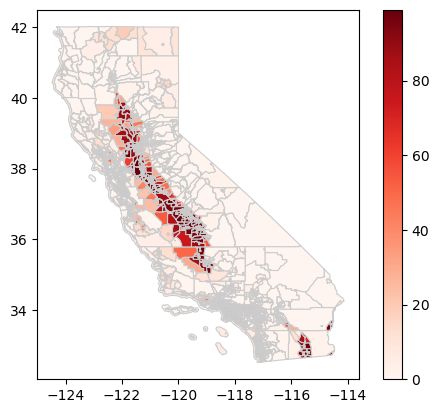

In [ ]:
# Plotting the GeoDataFrame
ca_geo_final.plot(column='percentile_tract_covered_impervious_surface_cropland',
                  cmap='Reds', linewidth=0.8, edgecolor='0.8', legend=True)

# Show the plot
plt.show()

In [ ]:
# select main columns to visualize - census tract level
ca_geo_cols_map = ca_geo_final.loc[:, [
    # 'census_tract', 'county', 'state',
    'pct_black_african_amer',
    # 'pct_amer_indian_alaska_native',
    'pct_asian',
    # 'pct_native_hawaii_pacific', 'pct_two_or_more_races',
    'pct_white',
    'pct_hispanic_latino',
    # 'pct_other_races',
    # 'pct_age_under_10',
    # 'pct_age_10_to_64',
    'pct_age_over_64',
    'total_threshold_criteria_exceeded',
    'total_categories_exceeded',
    # 'disadvantaged_without_neighbors',
    # 'disadvantaged_with_neighbors_relaxed_low_inc_threshold',
    'disadvantaged',
    'unemployment_pct',
    'adj_pct_indiv_below_200_fpl_percentile',
    'adj_pct_indiv_below_200_fpl',
    'is_low_income',
    'pct_indiv_below_200_fpl',
    'pct_indiv_below_100_fpl',
    # 'total_population',
    # 'expected_population_loss_rate_nri',
    'energy_burden',
    'housing_burden_pct',
    'median_value_owner_occupied_housing_units',
    # 'tract_min_35_acres',
    'asthma_among_18plus_adults',
    'diabetes_among_18plus_adults',
    'heart_disease_among_18plus_adults',
    'life_expectancy_years',
    'merge_id_census_tract',
    'expected_agri_loss_rate_nri',
    'expected_building_loss_rate_nri',
    'developed_open_space_area21',
    'developed_low_intensity_area22',
    # 'developed_med_intensity_area23',
    # 'developed_high_intensity_area24',
    'tract_covered_impervious_surface_cropland',
    # 'percentile_tract_covered_impervious_surface_cropland',
    # 'developed_open_space_prop21', 'developed_low_intensity_prop22',
    # 'developed_med_intensity_prop23', 'developed_high_intensity_prop24',
    'merge_id_county',
    # 'min_temp_celsius',
    # 'max_temp_celsius',
    # 'avg_temp_celsius',
    # 'st_dev_temp_celsius',
    # 'year_temp',
    'avg_temp_fahren',
    'share_of_properties_fire_risk_in_30_years',
    # 'STATEFP', 'COUNTYFP', 'TRACTCE', 'NAME', 'NAMELSAD',
    # 'MTFCC', 'FUNCSTAT', 'ALAND', 'AWATER', 'INTPTLAT', 'INTPTLON',
    'geometry']]

In [ ]:
# select main columns to visualize - county level
county_geo_cols = ca_geo_county.loc[:, [
    # 'census_tract', 'county', 'state',
    'pct_black_african_amer',
    # 'pct_amer_indian_alaska_native',
    'pct_asian',
    # 'pct_native_hawaii_pacific', 'pct_two_or_more_races',
    'pct_white',
    'pct_hispanic_latino',
    # 'pct_other_races',
    # 'pct_age_under_10',
    # 'pct_age_10_to_64',
    'pct_age_over_64',
    'total_threshold_criteria_exceeded',
    'total_categories_exceeded',
    # 'disadvantaged_without_neighbors',
    # 'disadvantaged_with_neighbors_relaxed_low_inc_threshold',
    'disadvantaged',
    'unemployment_pct',
    'adj_pct_indiv_below_200_fpl_percentile',
    'adj_pct_indiv_below_200_fpl',
    'is_low_income',
    'pct_indiv_below_200_fpl',
    'pct_indiv_below_100_fpl',
    'total_population',
    # 'expected_population_loss_rate_nri',
    'energy_burden',
    'housing_burden_pct',
    'median_value_owner_occupied_housing_units',
    # 'tract_min_35_acres',
    'asthma_among_18plus_adults',
    'diabetes_among_18plus_adults',
    'heart_disease_among_18plus_adults',
    'life_expectancy_years',
    # 'merge_id_census_tract',
    'expected_agri_loss_rate_nri',
    'expected_building_loss_rate_nri',
    'developed_open_space_area21',
    'developed_low_intensity_area22',
    'developed_med_intensity_area23',
    'developed_high_intensity_area24',
    'tract_covered_impervious_surface_cropland',
    'percentile_tract_covered_impervious_surface_cropland',
    # 'developed_open_space_prop21', 'developed_low_intensity_prop22',
    # 'developed_med_intensity_prop23', 'developed_high_intensity_prop24',
    # 'merge_id_county',
    # 'min_temp_celsius',
    # 'max_temp_celsius',
    # 'avg_temp_celsius',
    # 'st_dev_temp_celsius',
    # 'year_temp',
    'avg_temp_fahren',
    'share_of_properties_fire_risk_in_30_years',
    # 'STATEFP', 'COUNTYFP', 'TRACTCE', 'NAME', 'NAMELSAD',
    # 'MTFCC', 'FUNCSTAT', 'ALAND', 'AWATER', 'INTPTLAT', 'INTPTLON',
    'geometry']]

In [ ]:
# Sort the GeoDataFrame by the column of interest in descending order
sorted_counties = ca_geo_county.sort_values(by='pct_white', ascending=True)

# Take the top 5 counties
sorted_counties.head()

,merge_id_county,pct_black_african_amer,pct_amer_indian_alaska_native,pct_asian,pct_native_hawaii_pacific,pct_two_or_more_races,pct_white,pct_hispanic_latino,pct_other_races,pct_age_under_10,pct_age_10_to_64,pct_age_over_64,total_threshold_criteria_exceeded,total_categories_exceeded,disadvantaged,unemployment_pct,adj_pct_indiv_below_200_fpl_percentile,adj_pct_indiv_below_200_fpl,is_low_income,pct_indiv_below_200_fpl,pct_indiv_below_100_fpl,total_population,energy_burden,housing_burden_pct,median_value_owner_occupied_housing_units,asthma_among_18plus_adults,diabetes_among_18plus_adults,heart_disease_among_18plus_adults,life_expectancy_years,expected_agri_loss_rate_nri,expected_building_loss_rate_nri,developed_open_space_area21,developed_low_intensity_area22,developed_med_intensity_area23,developed_high_intensity_area24,tract_covered_impervious_surface_cropland,percentile_tract_covered_impervious_surface_cropland,avg_temp_fahren,share_of_properties_fire_risk_in_30_years,STATEFP,COUNTYFP,COUNTYNS,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,CSAFP,CBSAFP,METDIVFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
12,06025,0.025161,0.019032,0.010645,0.000323,0.034516,0.151935,0.768387,0.261290,0.147419,0.695806,0.142581,4.258065,3.064516,0.935484,16.774194,0.716452,0.402258,0.774194,48.935484,26.161290,5829.064516,5.774194,31.451613,180876.666667,969.806452,1443.419355,666.677419,80.021724,0.109894,0.000961,3.564570e+06,5.613445e+06,1.736332e+06,260912.903226,5928.451613,74.677419,75.951275,55.032258,06,025,00277277,Imperial,Imperial County,06,H1,G4020,None,20940,None,A,10814594615,790217372,+33.0408143,-115.3554001,"POLYGON ((-114.72652 32.71827, -114.72663 32.7..."
18,06037,0.075215,0.005327,0.139819,0.001638,0.035198,0.264252,0.474983,0.203826,0.112210,0.741793,0.131071,2.694373,1.889599,0.488491,5.682895,0.493332,0.247528,0.365729,34.528676,14.729625,4297.016205,1.424072,36.539593,632748.344211,786.783133,1030.291738,463.364028,80.560301,0.003155,0.008795,4.505535e+05,3.548586e+05,5.929251e+05,220231.123547,6040.452259,75.582268,65.129154,18.318958,06,037,00277283,Los Angeles,Los Angeles County,06,H1,G4020,348,31080,31084,A,10511861492,1793485467,+34.1963983,-118.2618616,"MULTIPOLYGON (((-118.70339 34.16859, -118.7033..."
23,06047,0.030204,0.006122,0.060204,0.000816,0.032857,0.284490,0.585510,0.285918,0.151837,0.721429,0.111633,3.571429,2.918367,0.816327,11.469388,0.711020,0.378163,0.755102,46.755102,21.448980,5538.408163,2.591837,29.551020,255255.102041,1012.265306,1163.204082,590.979592,78.287708,0.894486,0.012982,4.226822e+06,1.656294e+06,1.083251e+06,163377.551020,5944.959184,75.489796,65.084552,76.428571,06,047,00277288,Merced,Merced County,06,H1,G4020,488,32900,None,A,5014506620,110178168,+37.1948063,-120.7228019,"POLYGON ((-120.68159 37.51863, -120.67691 37.5..."
53,06107,0.013462,0.009359,0.025641,0.001282,0.028462,0.294103,0.627949,0.150256,0.159744,0.705769,0.119231,3.910256,3.012821,0.782051,9.410256,0.756410,0.431154,0.730769,51.294872,24.500000,5921.769231,3.038961,32.753247,196888.311688,1020.166667,1239.602564,637.397436,77.986494,0.000000,0.008491,2.787715e+06,1.199077e+06,1.352815e+06,247580.769231,6375.961538,79.333333,57.891822,74.833333,06,107,00277318,Tulare,Tulare County,06,H1,G4020,None,47300,None,A,12494889125,37207487,+36.2288339,-118.7810551,"POLYGON ((-118.80373 35.79035, -118.80496 35.7..."
9,06019,0.044774,0.008492,0.093970,0.000804,0.036834,0.299095,0.517638,0.138643,0.149246,0.715678,0.119698,3.462312,2.427136,0.618090,8.606061,0.630854,0.354925,0.587940,45.333333,22.575758,4947.341709,3.191919,30.888889,236053.571429,984.015075,1202.472362,563.804020,78.387330,0.476631,0.012513,2.241317e+06,1.140757e+06,1.156170e+06,322313.065327,5975.929648,75.964824,59.153028,41.221106,06,019,00277274,Fresno,Fresno County,06,H1,G4020,260,23420,None,A,15432139300,136609898,+36.7610058,-119.6550193,"POLYGON ((-120.42219 36.84014, -120.42172 36.8..."


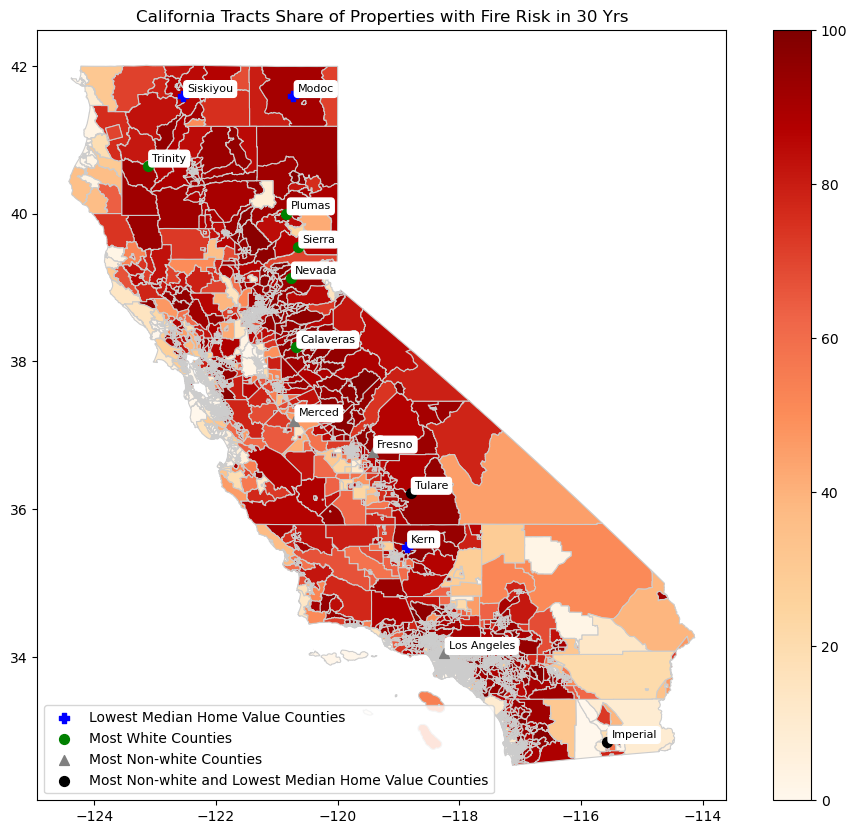

In [ ]:
# temp and fire risk

low_home_value = {
    'County': ['Modoc', 'Siskiyou', 'Kern'],
    'Latitude': [41.5908, 41.5910, 35.4937],
    'Longitude': [-120.7245, -122.5407, -118.8597]
}

nonwhite_low_home = {
    'County': ['Imperial', 'Tulare'],
    'Latitude': [32.8470, 36.2203],
    'Longitude': [-115.5694, -118.8005]
}


# high_home_value = {
#     'County': ['San Mateo', 'San Francisco', 'Marin', 'Santa Clara', 'Alameda'],
#     'Latitude': [37.4224, 37.7749, 38.0834, 37.3541, 37.7749],
#     'Longitude': [-122.1657, -122.4194, -122.7633, -121.9552, -122.4194]
# }

white_counties_loc = {
    'County': ['Sierra', 'Nevada', 'Plumas', 'Calaveras', 'Trinity'],
    'Latitude': [39.5533, 39.1347, 40.0030, 38.1960, 40.6495],
    'Longitude': [-120.6477, -120.7681, -120.8395, -120.6805, -123.1151]}

nonwhite_counties_loc = {
    'County': ['Los Angeles', 'Merced', 'Fresno'],
    'Latitude': [34.0522, 37.2010, 36.7783],
    'Longitude': [-118.2437, -120.7120, -119.4179]
}

white_counties_df = gpd.GeoDataFrame(white_counties_loc, geometry=gpd.points_from_xy(
    white_counties_loc['Longitude'], white_counties_loc['Latitude']), crs='EPSG:4326')
nonwhite_counties_df = gpd.GeoDataFrame(nonwhite_counties_loc, geometry=gpd.points_from_xy(
    nonwhite_counties_loc['Longitude'], nonwhite_counties_loc['Latitude']), crs='EPSG:4326')
low_home_value_df = gpd.GeoDataFrame(low_home_value, geometry=gpd.points_from_xy(
    low_home_value['Longitude'], low_home_value['Latitude']), crs='EPSG:4326')
nonwhite_low_home_df = gpd.GeoDataFrame(nonwhite_low_home, geometry=gpd.points_from_xy(
    nonwhite_low_home['Longitude'], nonwhite_low_home['Latitude']), crs='EPSG:4326')
# Plotting the GeoDataFrame with a color gradient
fig, ax = plt.subplots(1, 1, figsize=(12, 10))

# Plot the GeoDataFrame with a color gradient
ca_geo_cols_map.plot(column='share_of_properties_fire_risk_in_30_years',
                     cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
# 'avg_temp_fahren'
# share_of_properties_fire_risk_in_30_years
# Plot key counties
low_home_value_df.plot(ax=ax, color='blue', marker='P',
                       markersize=50, label='Lowest Median Home Value Counties')
white_counties_df.plot(ax=ax, color='green', marker='o',
                       markersize=50, label='Most White Counties')
nonwhite_counties_df.plot(ax=ax, color='gray', marker='^',
                          markersize=50, label='Most Non-white Counties')
nonwhite_low_home_df.plot(ax=ax, color='black', marker='o', markersize=50,
                          label='Most Non-white and Lowest Median Home Value Counties')

# Annotate city labels
for idx, row in low_home_value_df.iterrows():
    ax.annotate(row['County'], xy=(row['Longitude'], row['Latitude']),
                xytext=(3, 3), textcoords='offset points', fontsize=8,
                bbox=dict(boxstyle='round, pad=0.3', edgecolor='white', facecolor='white'))

    # Annotate city labels
for idx, row in white_counties_df.iterrows():
    ax.annotate(row['County'], xy=(row['Longitude'], row['Latitude']),
                xytext=(3, 3), textcoords='offset points', fontsize=8,
                bbox=dict(boxstyle='round, pad=0.3', edgecolor='white', facecolor='white'))

for idx, row in nonwhite_counties_df.iterrows():
    ax.annotate(row['County'], xy=(row['Longitude'], row['Latitude']),
                xytext=(3, 3), textcoords='offset points', fontsize=8,
                bbox=dict(boxstyle='round, pad=0.3', edgecolor='white', facecolor='white'))
for idx, row in nonwhite_low_home_df.iterrows():
    ax.annotate(row['County'], xy=(row['Longitude'], row['Latitude']),
                xytext=(3, 3), textcoords='offset points', fontsize=8,
                bbox=dict(boxstyle='round, pad=0.3', edgecolor='white', facecolor='white'))

    # Set plot title
plt.title(f'California Tracts Share of Properties with Fire Risk in 30 Yrs')
# plt.title(f'California Avg County Temperatures in Degrees F')
ax.legend()

# Show the plot
plt.show()

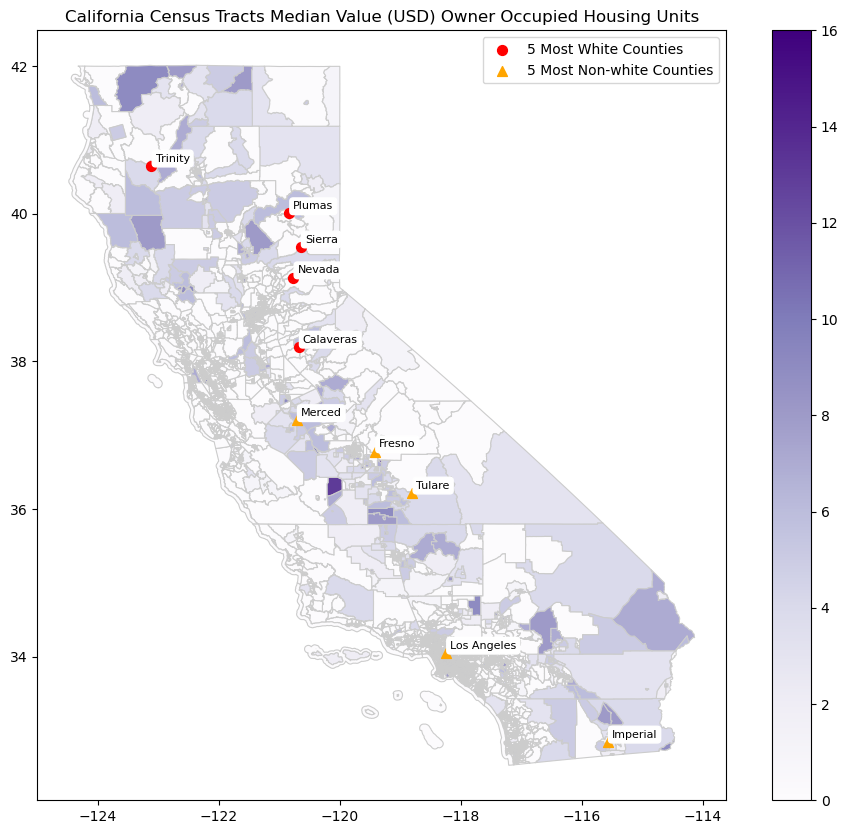

In [ ]:
# CENSUS TRACT VIEW
white_counties_loc = {
    'County': ['Sierra', 'Nevada', 'Plumas', 'Calaveras', 'Trinity'],
    'Latitude': [39.5533, 39.1347, 40.0030, 38.1960, 40.6495],
    'Longitude': [-120.6477, -120.7681, -120.8395, -120.6805, -123.1151]}

nonwhite_counties_loc = {
    'County': ['Imperial', 'Los Angeles', 'Merced', 'Tulare', 'Fresno'],
    'Latitude': [32.8470, 34.0522, 37.2010, 36.2203, 36.7783],
    'Longitude': [-115.5694, -118.2437, -120.7120, -118.8005, -119.4179]
}

white_counties_df = gpd.GeoDataFrame(white_counties_loc, geometry=gpd.points_from_xy(
    white_counties_loc['Longitude'], white_counties_loc['Latitude']), crs='EPSG:4326')
nonwhite_counties_df = gpd.GeoDataFrame(nonwhite_counties_loc, geometry=gpd.points_from_xy(
    nonwhite_counties_loc['Longitude'], nonwhite_counties_loc['Latitude']), crs='EPSG:4326')

# Plotting the GeoDataFrame with a color gradient
fig, ax = plt.subplots(1, 1, figsize=(12, 10))

# Plot the GeoDataFrame with a color gradient
ca_geo_cols_map.plot(column='total_threshold_criteria_exceeded',
                     cmap='Purples', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
# 'total_threshold_criteria_exceeded',
# 'total_categories_exceeded',
# median_value_owner_occupied_housing_units
# adj_pct....
# Plot major cities on top
white_counties_df.plot(ax=ax, color='red', marker='o',
                       markersize=50, label='5 Most White Counties')
nonwhite_counties_df.plot(ax=ax, color='orange', marker='^',
                          markersize=50, label='5 Most Non-white Counties')

# Annotate city labels
for idx, row in white_counties_df.iterrows():
    ax.annotate(row['County'], xy=(row['Longitude'], row['Latitude']),
                xytext=(3, 3), textcoords='offset points', fontsize=8,
                bbox=dict(boxstyle='round, pad=0.3', edgecolor='white', facecolor='white'))

for idx, row in nonwhite_counties_df.iterrows():
    ax.annotate(row['County'], xy=(row['Longitude'], row['Latitude']),
                xytext=(3, 3), textcoords='offset points', fontsize=8,
                bbox=dict(boxstyle='round, pad=0.3', edgecolor='white', facecolor='white'))

    # Set plot title
# plt.title(f'California Census Tracts Adjusted Percent of Individuals Below 200% FPL')
plt.title(f'California Census Tracts Median Value (USD) Owner Occupied Housing Units')
ax.legend()

# Show the plot
plt.show()

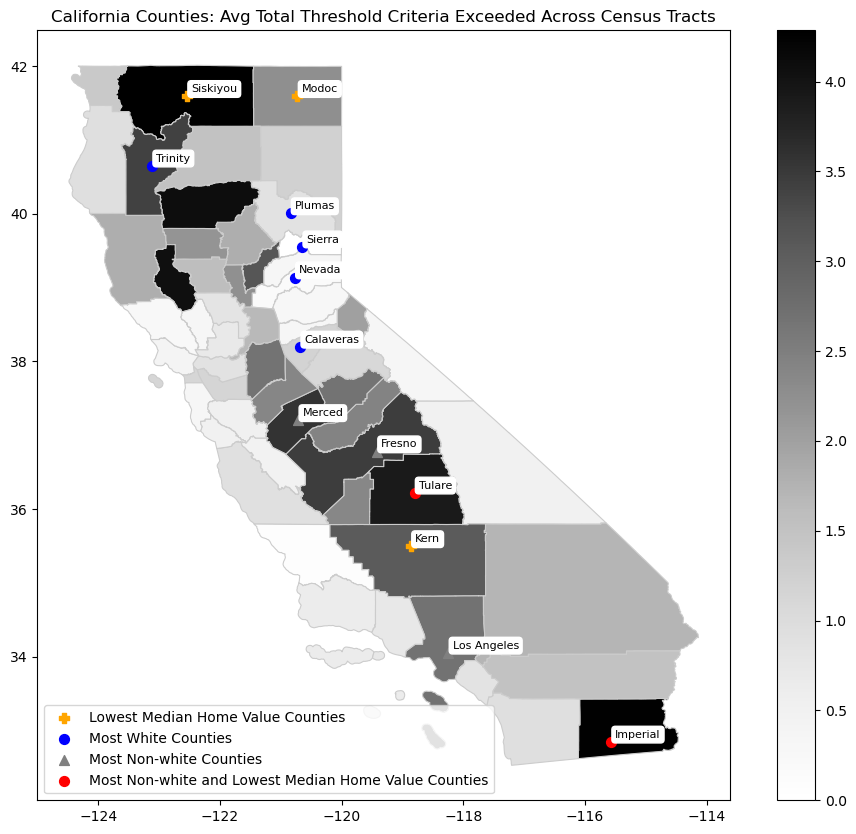

In [ ]:
# COUNTY VIEW
# white_counties_loc = {
#     'County': ['Sierra', 'Nevada', 'Plumas', 'Calaveras', 'Trinity'],
#     'Latitude': [39.5533, 39.1347, 40.0030, 38.1960, 40.6495],
#     'Longitude': [-120.6477, -120.7681, -120.8395, -120.6805, -123.1151]}

# nonwhite_counties_loc = {
#     'County': ['Imperial', 'Los Angeles', 'Merced', 'Tulare', 'Fresno'],
#     'Latitude': [32.8470, 34.0522, 37.2010, 36.2203, 36.7783],
#     'Longitude': [-115.5694, -118.2437, -120.7120, -118.8005, -119.4179]
# }

# white_counties_df = gpd.GeoDataFrame(white_counties_loc, geometry=gpd.points_from_xy(white_counties_loc['Longitude'], white_counties_loc['Latitude']), crs='EPSG:4326')
# nonwhite_counties_df = gpd.GeoDataFrame(nonwhite_counties_loc, geometry=gpd.points_from_xy(nonwhite_counties_loc['Longitude'], nonwhite_counties_loc['Latitude']), crs='EPSG:4326')

#     # Plotting the GeoDataFrame with a color gradient
# fig, ax = plt.subplots(1, 1, figsize=(12, 10))

#     #total_threshold_criteria_exceeded
#     #median_value_owner_occupied_housing_units
#     # Plot major cities on top
# white_counties_df.plot(ax=ax, color='red', marker='o', markersize=50, label='5 Most White Counties')
# nonwhite_counties_df.plot(ax=ax, color='orange', marker='^', markersize=50, label='5 Most Non-white Counties')

#     # Annotate city labels
# for idx, row in white_counties_df.iterrows():
#     ax.annotate(row['County'], xy=(row['Longitude'], row['Latitude']),
#                 xytext=(3, 3), textcoords='offset points', fontsize=8,
#                 bbox=dict(boxstyle='round, pad=0.3', edgecolor='white', facecolor='white'))

# for idx, row in nonwhite_counties_df.iterrows():
#     ax.annotate(row['County'], xy=(row['Longitude'], row['Latitude']),
#                 xytext=(3, 3), textcoords='offset points', fontsize=8,
#                 bbox=dict(boxstyle='round, pad=0.3', edgecolor='white', facecolor='white'))


low_home_value = {
    'County': ['Modoc', 'Siskiyou', 'Kern'],
    'Latitude': [41.5908, 41.5910, 35.4937],
    'Longitude': [-120.7245, -122.5407, -118.8597]
}

nonwhite_low_home = {
    'County': ['Imperial', 'Tulare'],
    'Latitude': [32.8470, 36.2203],
    'Longitude': [-115.5694, -118.8005]
}

white_counties_loc = {
    'County': ['Sierra', 'Nevada', 'Plumas', 'Calaveras', 'Trinity'],
    'Latitude': [39.5533, 39.1347, 40.0030, 38.1960, 40.6495],
    'Longitude': [-120.6477, -120.7681, -120.8395, -120.6805, -123.1151]}

nonwhite_counties_loc = {
    'County': ['Los Angeles', 'Merced', 'Fresno'],
    'Latitude': [34.0522, 37.2010, 36.7783],
    'Longitude': [-118.2437, -120.7120, -119.4179]
}

white_counties_df = gpd.GeoDataFrame(white_counties_loc, geometry=gpd.points_from_xy(
    white_counties_loc['Longitude'], white_counties_loc['Latitude']), crs='EPSG:4326')
nonwhite_counties_df = gpd.GeoDataFrame(nonwhite_counties_loc, geometry=gpd.points_from_xy(
    nonwhite_counties_loc['Longitude'], nonwhite_counties_loc['Latitude']), crs='EPSG:4326')
low_home_value_df = gpd.GeoDataFrame(low_home_value, geometry=gpd.points_from_xy(
    low_home_value['Longitude'], low_home_value['Latitude']), crs='EPSG:4326')
nonwhite_low_home_df = gpd.GeoDataFrame(nonwhite_low_home, geometry=gpd.points_from_xy(
    nonwhite_low_home['Longitude'], nonwhite_low_home['Latitude']), crs='EPSG:4326')
# Plotting the GeoDataFrame with a color gradient
fig, ax = plt.subplots(1, 1, figsize=(12, 10))

# Plot the GeoDataFrame with a color gradient
county_geo_cols.plot(column='total_threshold_criteria_exceeded',
                     cmap='Greys', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
# developed_low_intensity_area22 YlGn
# developed_open_space_area21',
# 'tract_covered_impervious_surface_cropland', Blues
#

# Plot key counties
low_home_value_df.plot(ax=ax, color='orange', marker='P',
                       markersize=50, label='Lowest Median Home Value Counties')
white_counties_df.plot(ax=ax, color='blue', marker='o',
                       markersize=50, label='Most White Counties')
nonwhite_counties_df.plot(ax=ax, color='gray', marker='^',
                          markersize=50, label='Most Non-white Counties')
nonwhite_low_home_df.plot(ax=ax, color='red', marker='o', markersize=50,
                          label='Most Non-white and Lowest Median Home Value Counties')

# Annotate city labels
for idx, row in low_home_value_df.iterrows():
    ax.annotate(row['County'], xy=(row['Longitude'], row['Latitude']),
                xytext=(3, 3), textcoords='offset points', fontsize=8,
                bbox=dict(boxstyle='round, pad=0.3', edgecolor='white', facecolor='white'))

    # Annotate city labels
for idx, row in white_counties_df.iterrows():
    ax.annotate(row['County'], xy=(row['Longitude'], row['Latitude']),
                xytext=(3, 3), textcoords='offset points', fontsize=8,
                bbox=dict(boxstyle='round, pad=0.3', edgecolor='white', facecolor='white'))

for idx, row in nonwhite_counties_df.iterrows():
    ax.annotate(row['County'], xy=(row['Longitude'], row['Latitude']),
                xytext=(3, 3), textcoords='offset points', fontsize=8,
                bbox=dict(boxstyle='round, pad=0.3', edgecolor='white', facecolor='white'))
for idx, row in nonwhite_low_home_df.iterrows():
    ax.annotate(row['County'], xy=(row['Longitude'], row['Latitude']),
                xytext=(3, 3), textcoords='offset points', fontsize=8,
                bbox=dict(boxstyle='round, pad=0.3', edgecolor='white', facecolor='white'))

    # Set plot title
# plt.title(f'California Counties: Avg Tract Area Covered by Impervious Surface or Cropland')
# plt.title(f'California Census Tracts Adjusted Percent of Individuals Below 200% FPL')
# plt.title(f'California Counties Avg Median Value (USD) Owner-Occupied Housing Across Census Tracts')
plt.title(
    f'California Counties: Avg Total Threshold Criteria Exceeded Across Census Tracts')
# plt.title(f'California Counties: Avg Developed Open Space Area')
# plt.title(f'California Counties: Avg Developed Low Intensity Area')
ax.legend()

# Show the plot
plt.show()

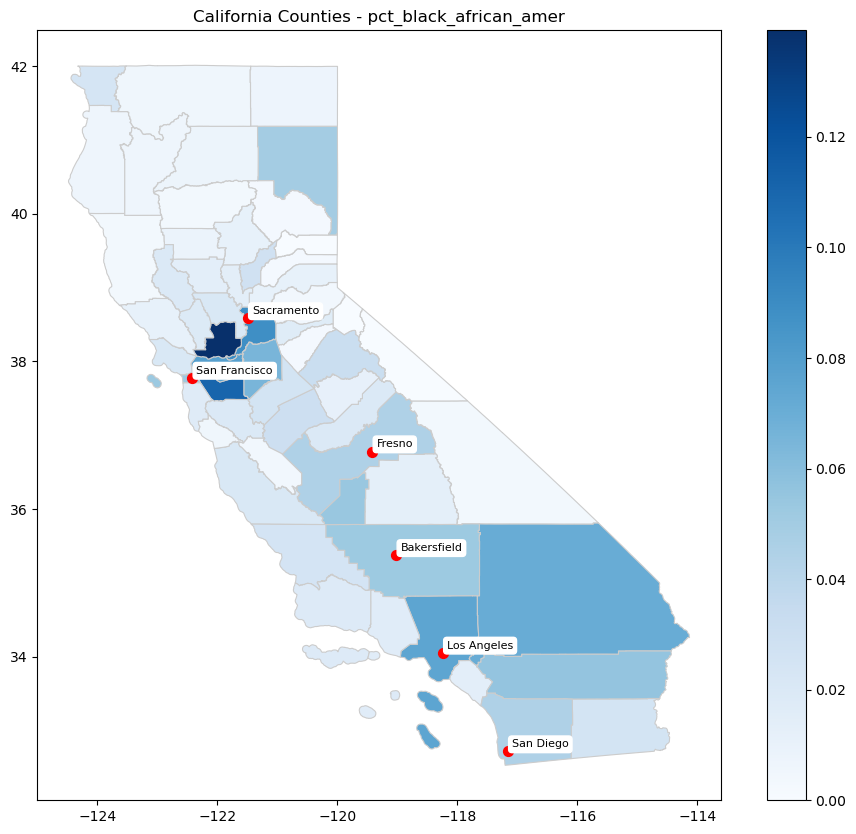

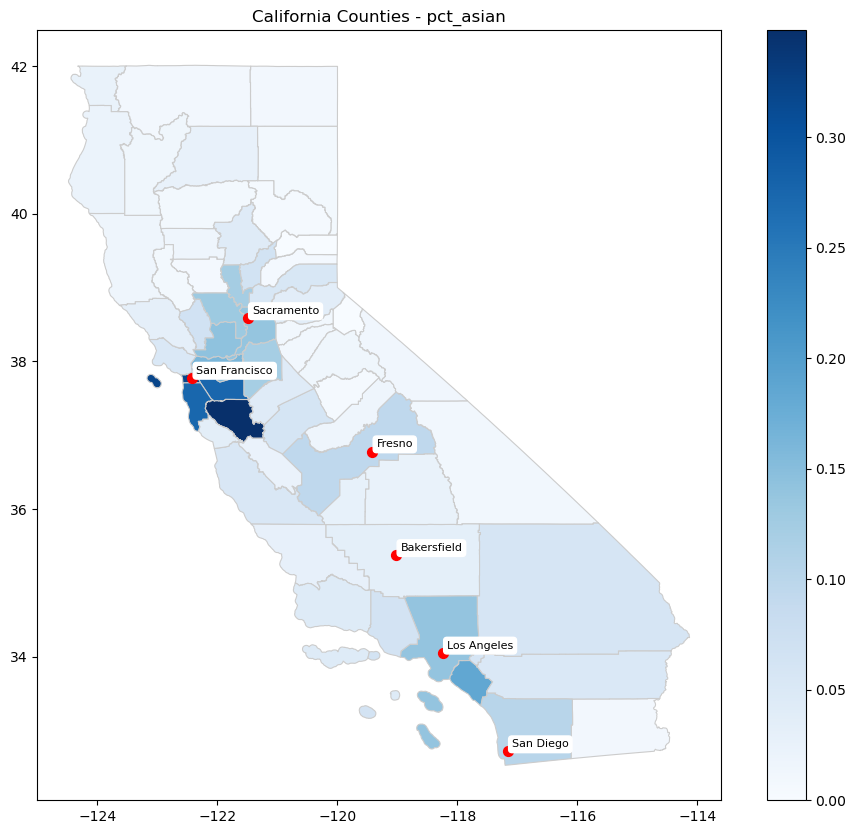

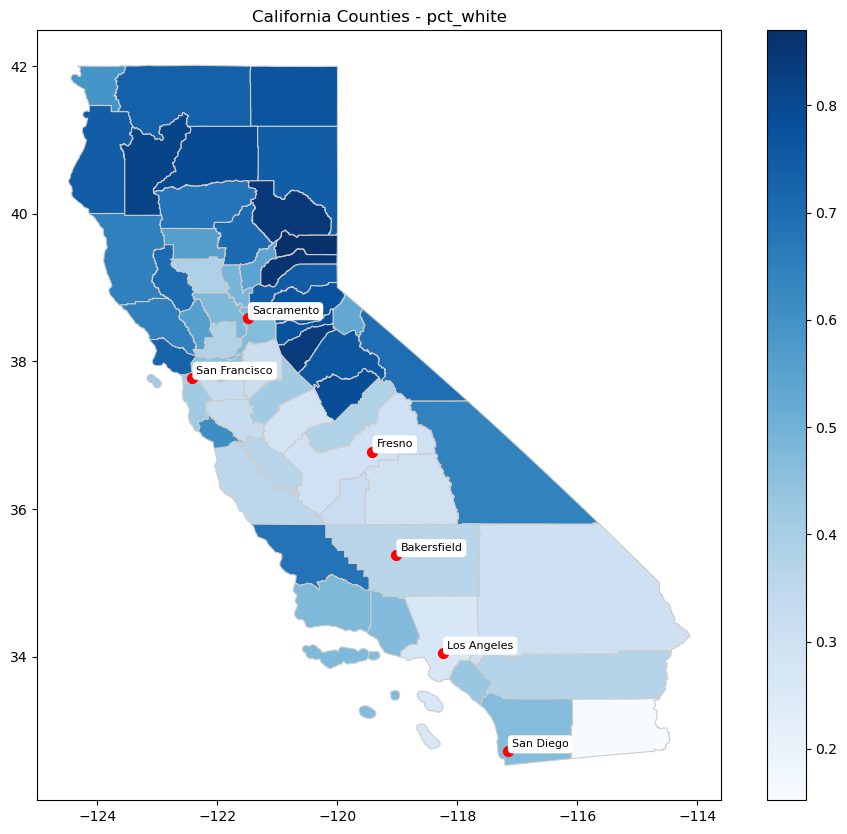

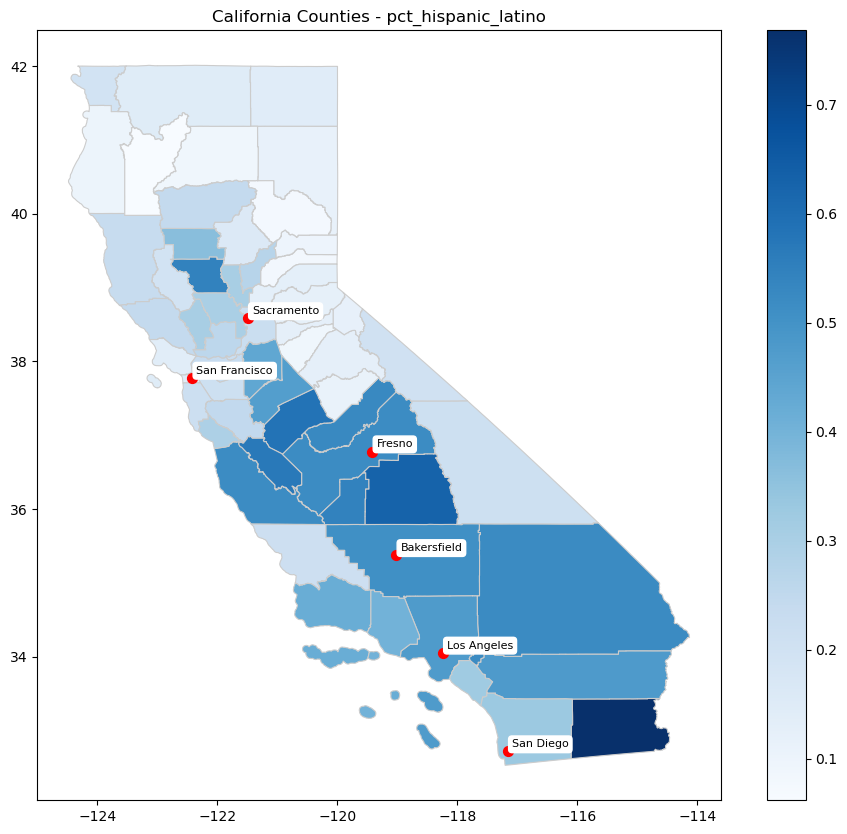

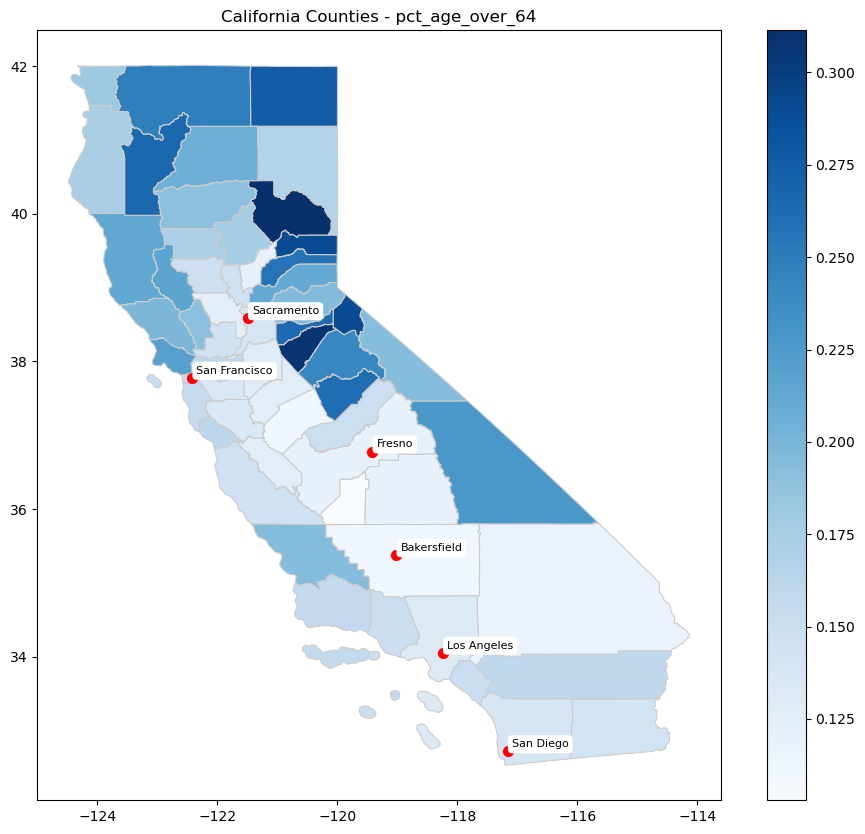

...

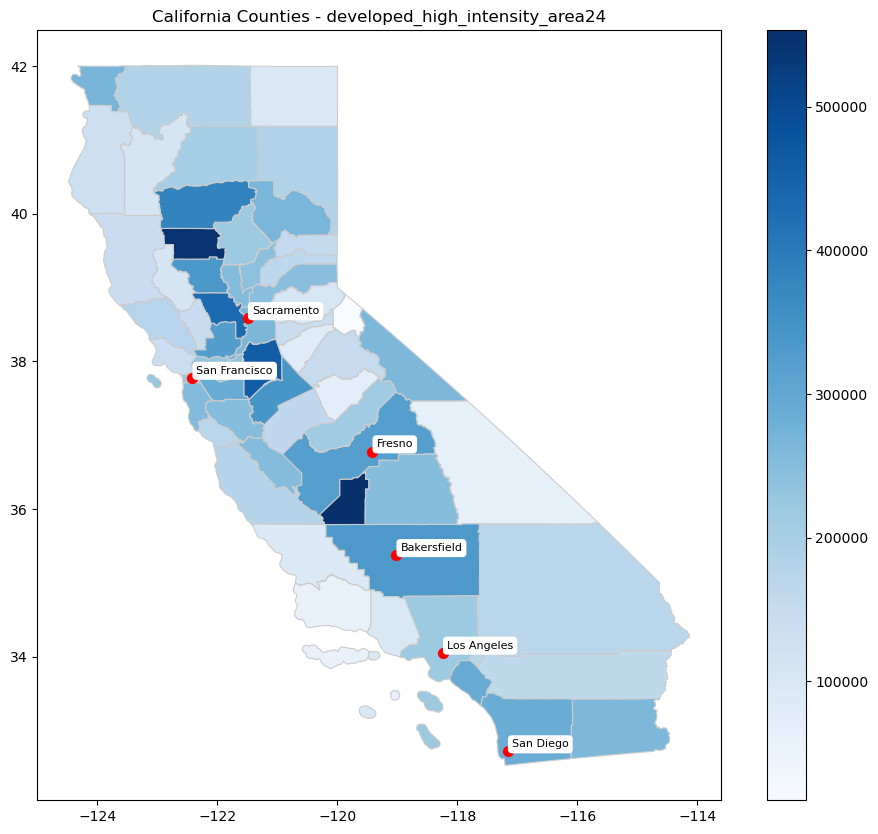

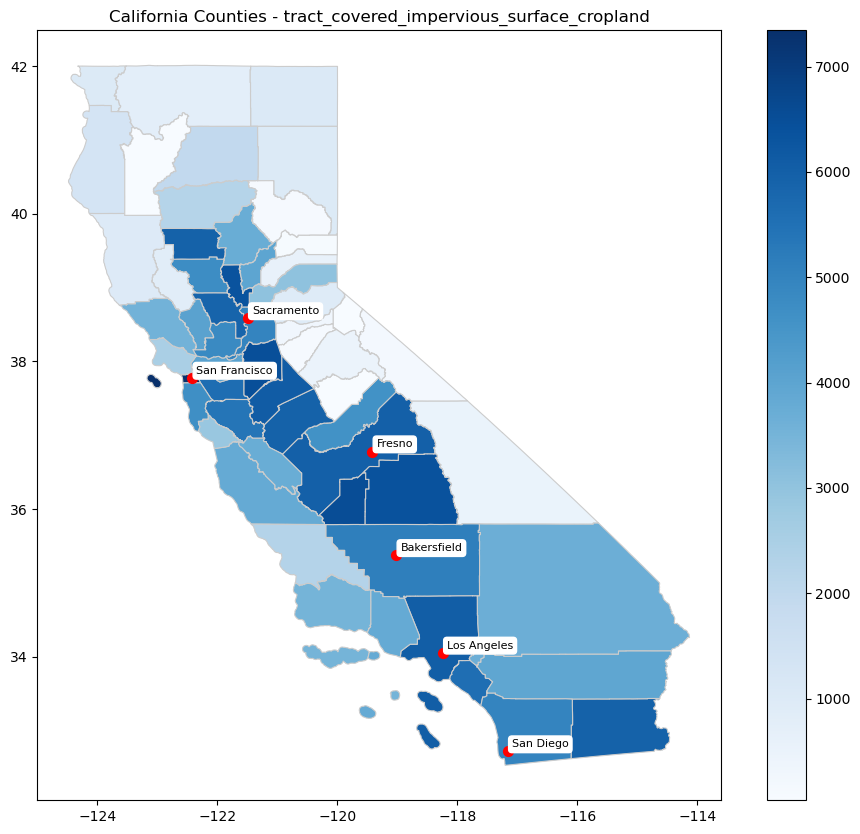

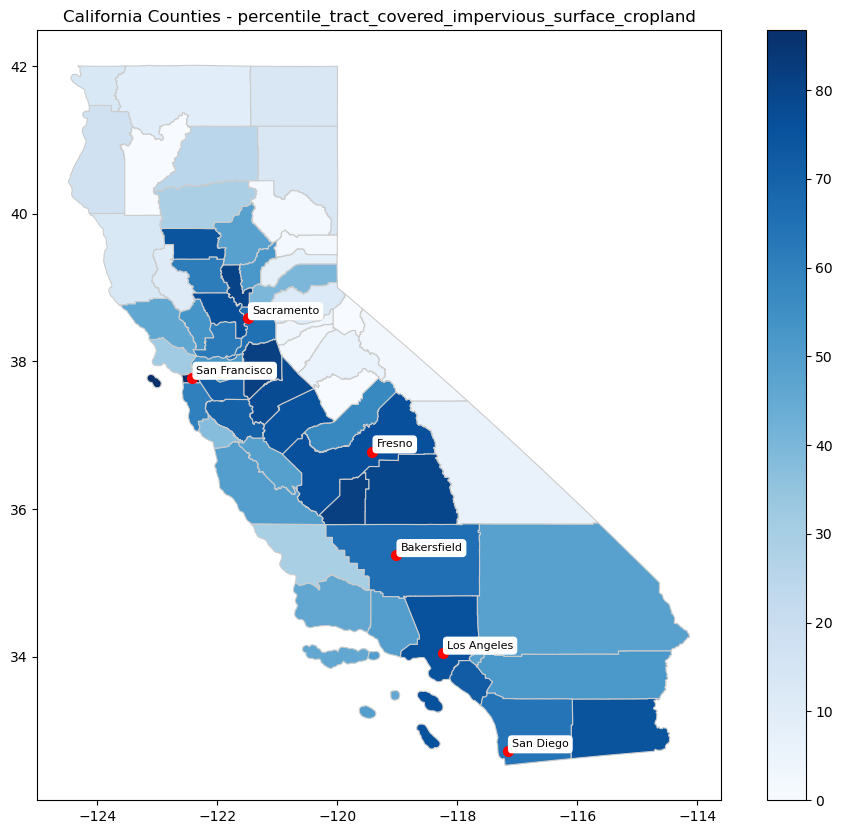

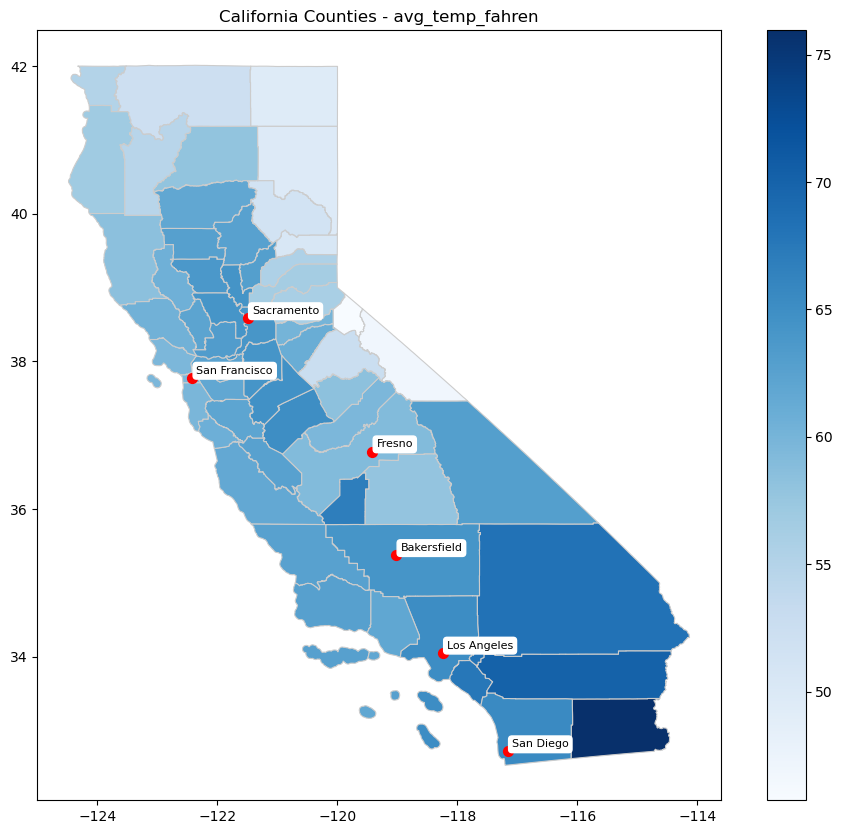

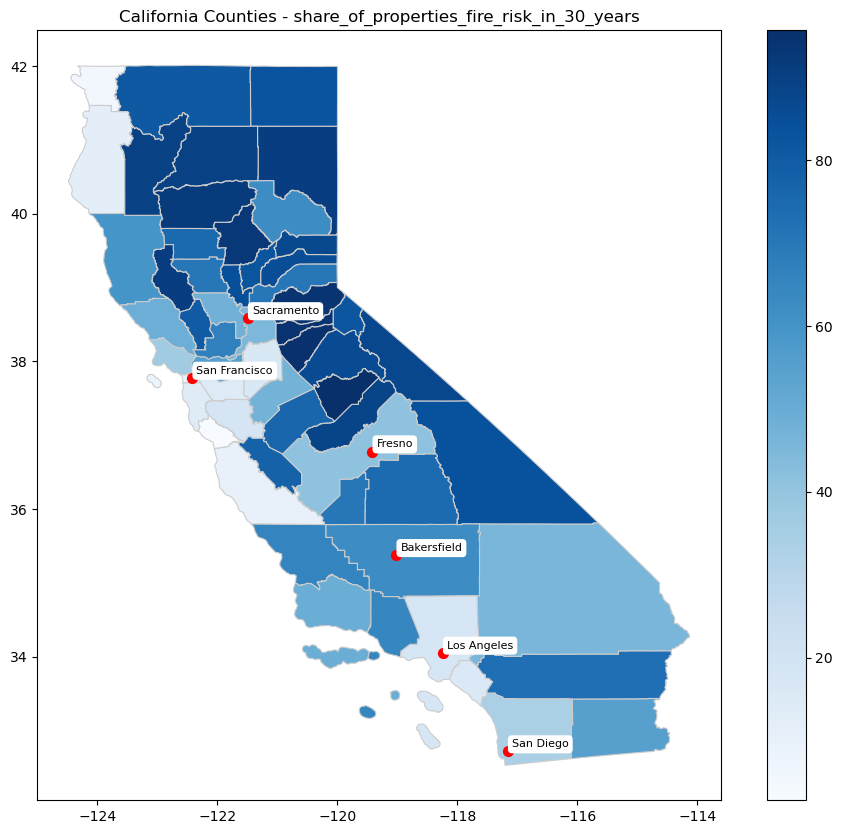

RuntimeError: In draw_glyphs_to_bitmap: Could not convert glyph to bitmap (raster overflow; error code 0x62)

ValueError: Image size of 1953266x1245 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1200x1000 with 1 Axes>

In [ ]:
# loop through each relevant column - COUNTY
for column in county_geo_cols:
    # Create a GeoDataFrame for major cities and avoid overlapping ones
    california_cities_data = {
        'City': ['Los Angeles', 'San Diego', 'San Francisco', 'Fresno', 'Sacramento', 'Bakersfield'],
        'Latitude': [34.0522, 32.7157, 37.7749, 36.7783, 38.5816, 35.3733],
        'Longitude': [-118.2437, -117.1611, -122.4194, -119.4179, -121.4944, -119.0187]}
    cities_df = gpd.GeoDataFrame(california_cities_data, geometry=gpd.points_from_xy(
        california_cities_data['Longitude'], california_cities_data['Latitude']), crs='EPSG:4326')

    # Plotting the GeoDataFrame with a color gradient
    fig, ax = plt.subplots(1, 1, figsize=(12, 10))  # well

    # Plot the GeoDataFrame with a color gradient
    county_geo_cols.plot(column=column, cmap='Blues',
                         linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

    # Plot major cities on top
    cities_df.plot(ax=ax, color='red', marker='o', markersize=50)

    # Annotate city labels
    for idx, row in cities_df.iterrows():
        ax.annotate(row['City'], xy=(row['Longitude'], row['Latitude']),
                    xytext=(3, 3), textcoords='offset points', fontsize=8,
                    bbox=dict(boxstyle='round, pad=0.3', edgecolor='white', facecolor='white'))

    # Set plot title
    plt.title(f'California Counties - {column}')

    # Show the plot
    plt.show()

In [ ]:
# limit to just Los Angeles county and exclude two US naval base tracts
ca_geo_cols_map_la = ca_geo_cols_map[(ca_geo_cols_map['merge_id_county'] == '06037') &
                                     (ca_geo_cols_map['merge_id_census_tract'] != '06037599000') &
                                     (ca_geo_cols_map['merge_id_census_tract'] != '06037599100')]

In [ ]:
ca_geo_cols_map_la = ca_geo_cols_map_la.loc[:, ['pct_black_african_amer', 'pct_asian', 'pct_white',
                                                'pct_hispanic_latino', 'pct_age_over_64',
                                                'total_threshold_criteria_exceeded', 'total_categories_exceeded',
                                                'disadvantaged', 'unemployment_pct',
                                                'adj_pct_indiv_below_200_fpl',
                                                'pct_indiv_below_200_fpl',
                                                'energy_burden', 'housing_burden_pct',
                                                'median_value_owner_occupied_housing_units', 'life_expectancy_years',
                                                'expected_agri_loss_rate_nri',
                                                'expected_building_loss_rate_nri', 'developed_open_space_area21',
                                                'developed_low_intensity_area22',
                                                'tract_covered_impervious_surface_cropland',
                                                'avg_temp_fahren', 'share_of_properties_fire_risk_in_30_years',
                                                'geometry']]

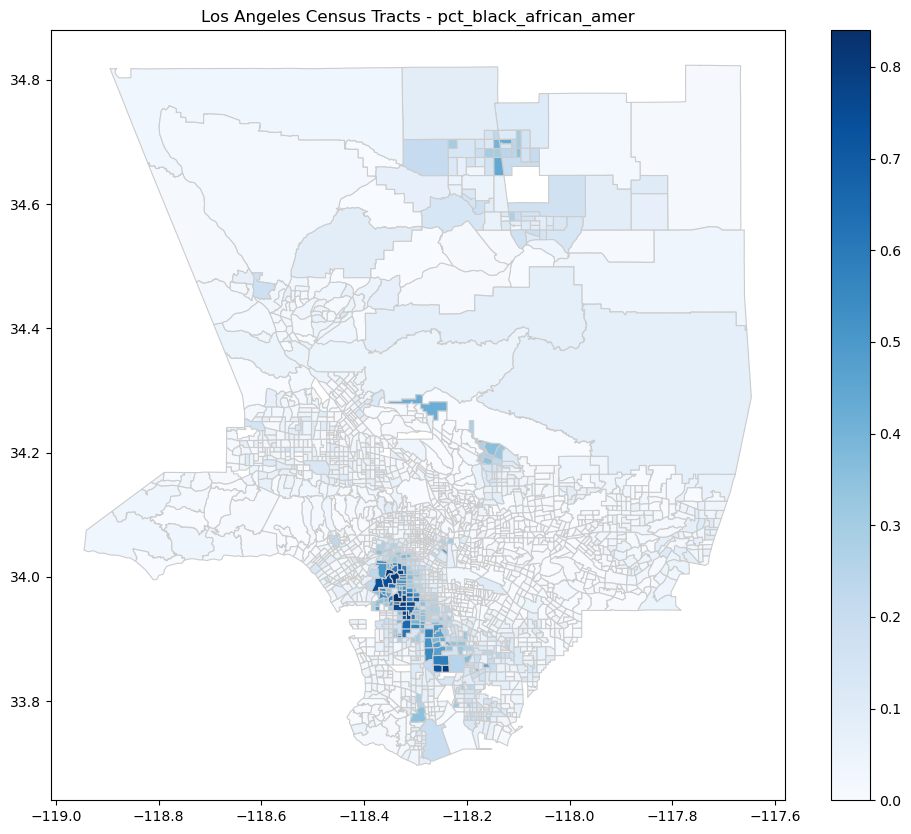

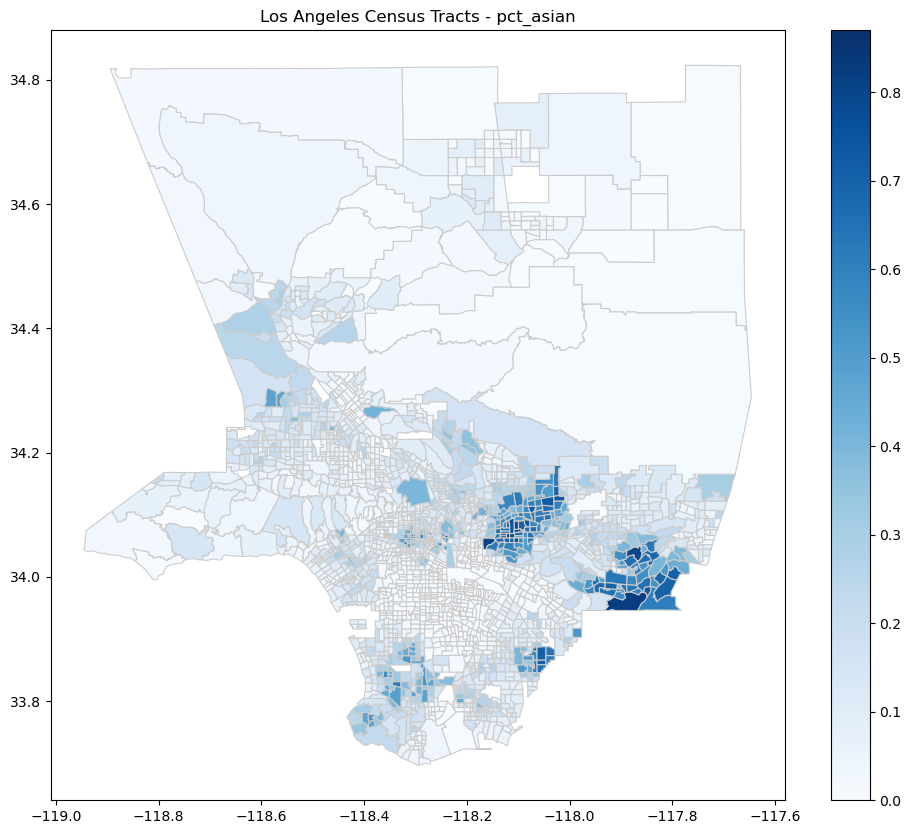

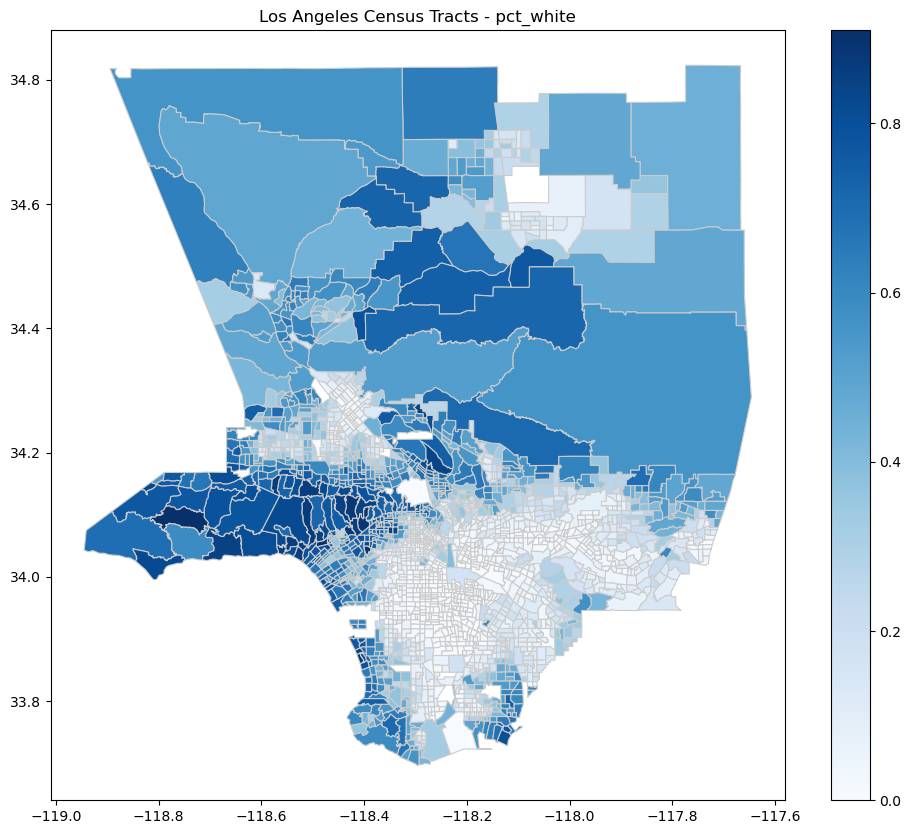

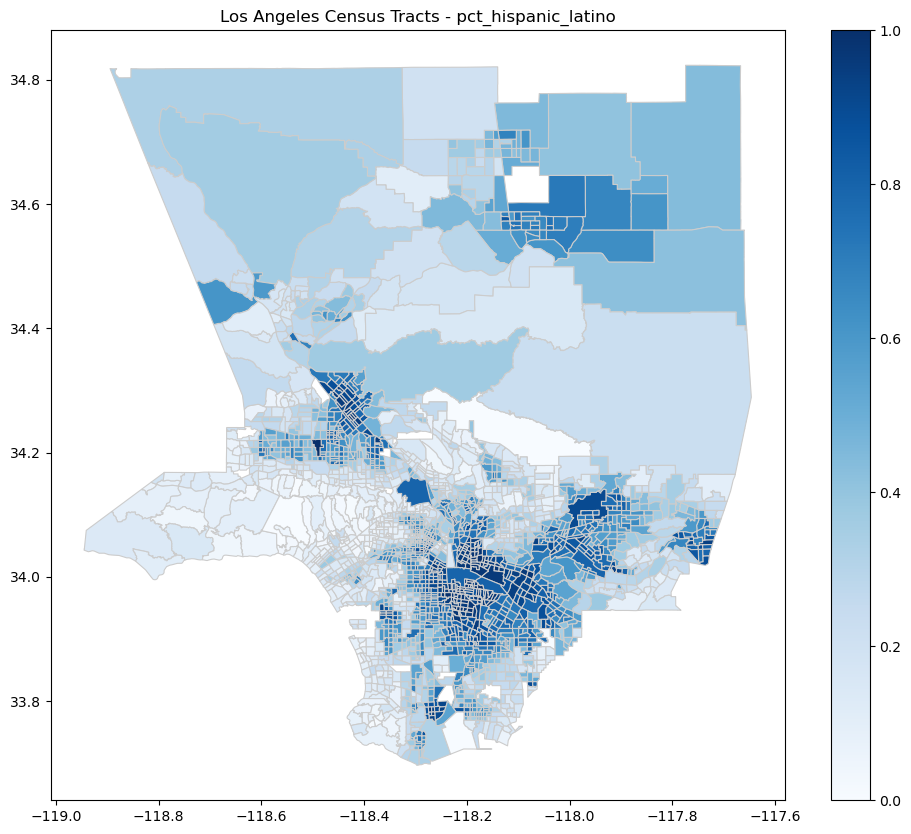

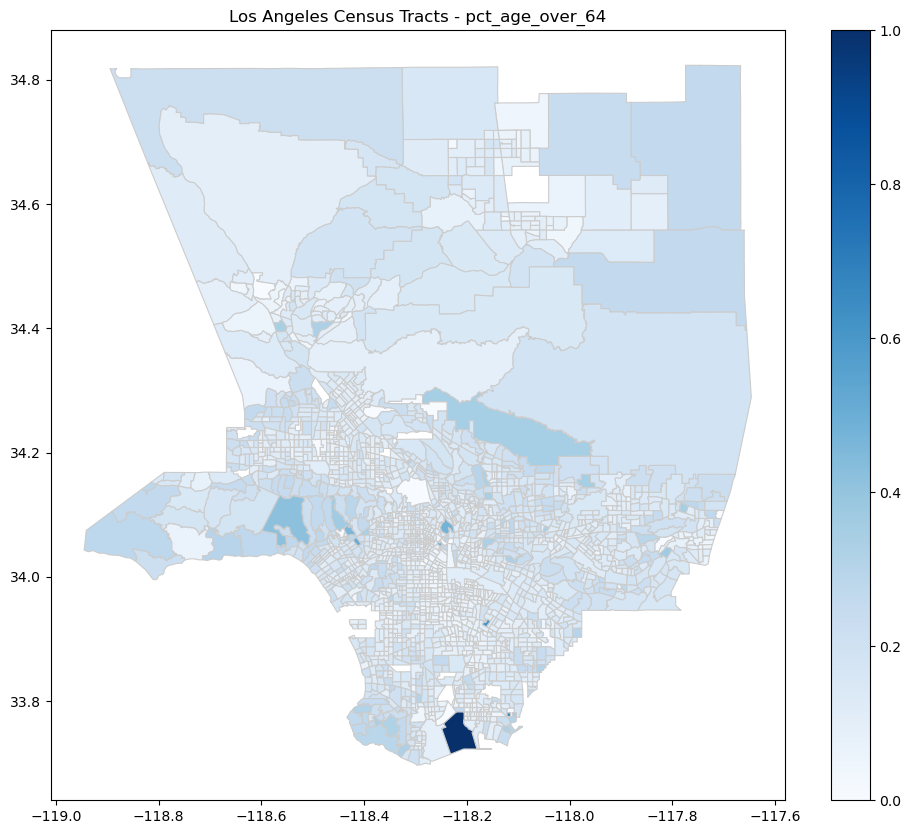

...

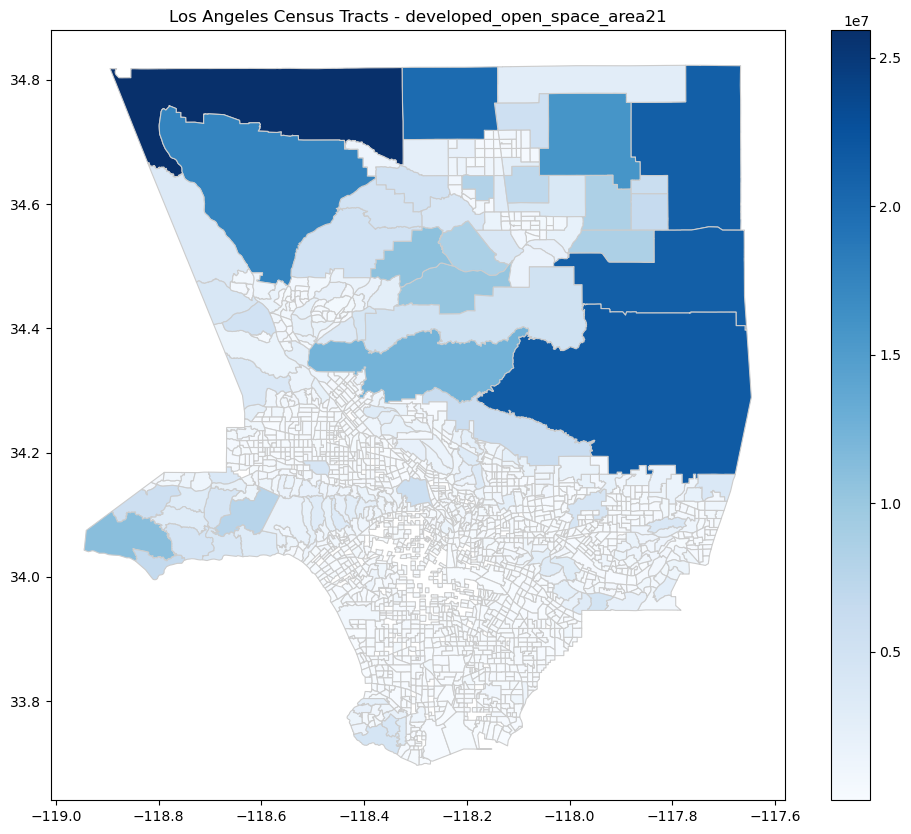

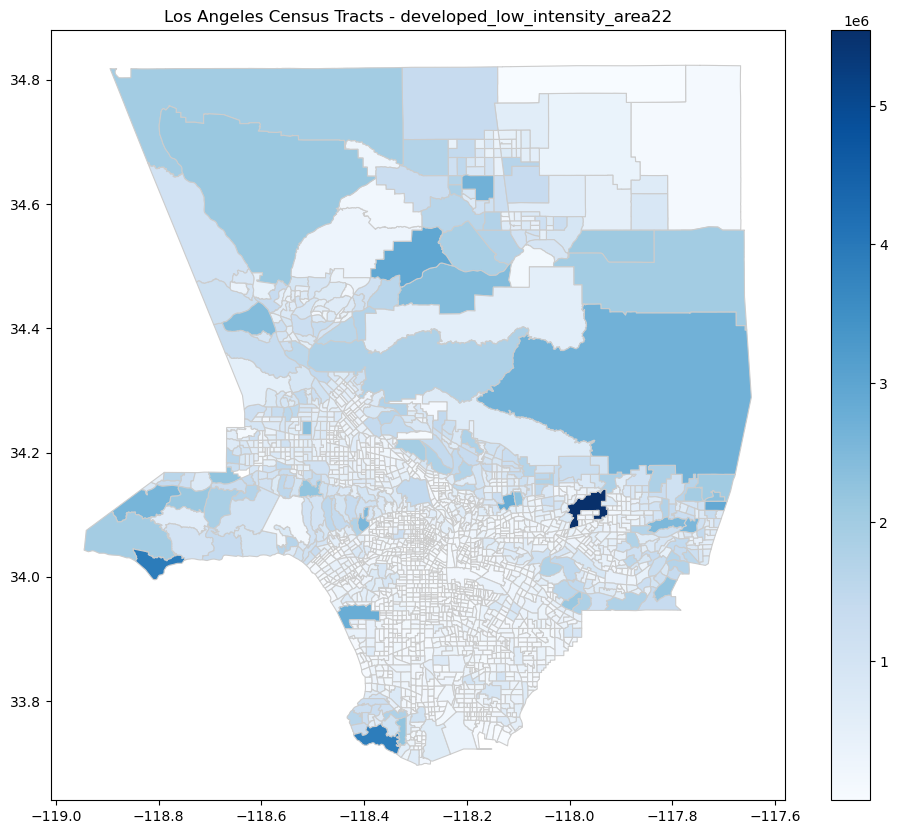

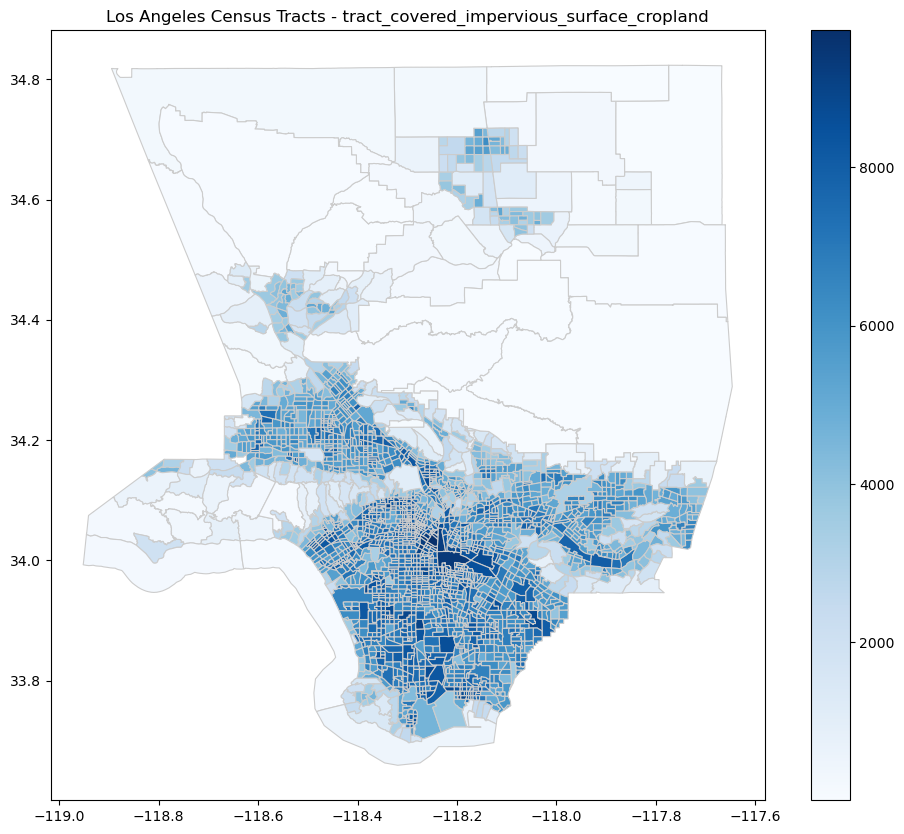

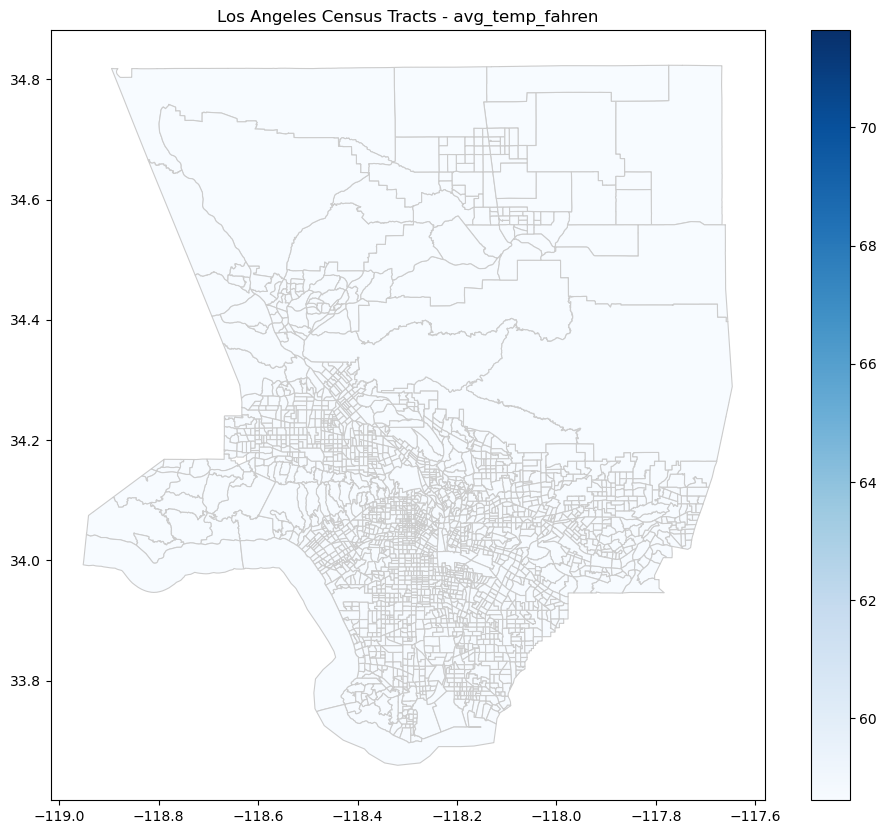

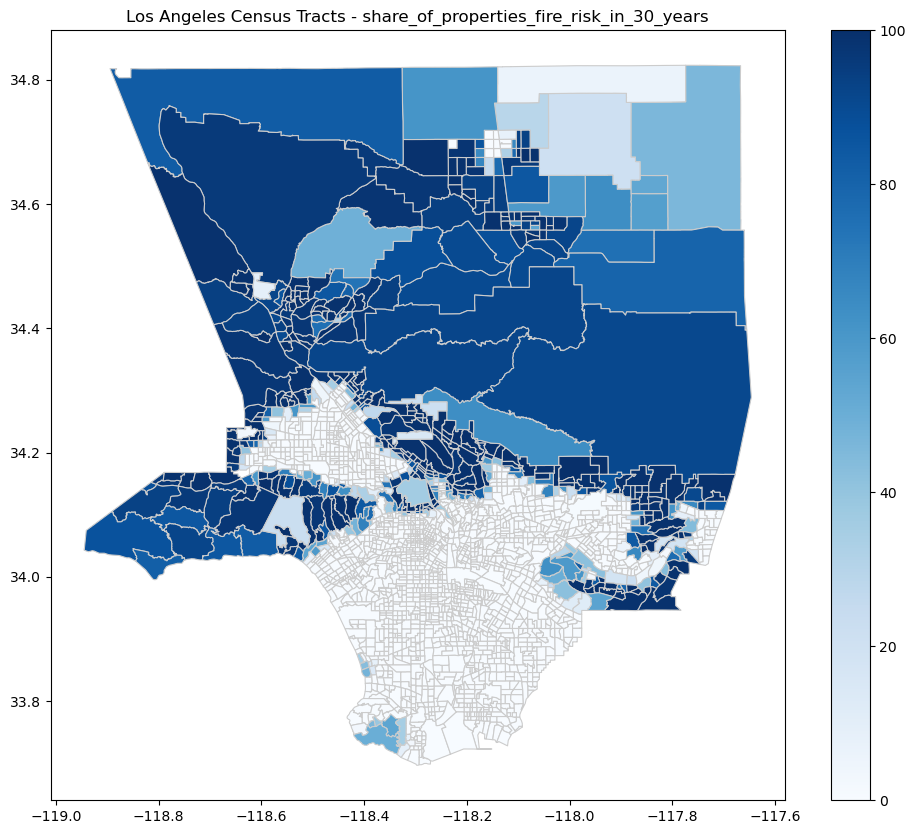

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7fd61be985e0> (for post_execute):


KeyboardInterrupt: 

In [ ]:
# loop through each relevant column - LA ONLY
for column in ca_geo_cols_map_la:
    # # Create a GeoDataFrame for major cities and avoid overlapping ones
    # california_cities_data = {
    # 'City': ['Los Angeles', 'San Diego', 'San Francisco', 'Fresno', 'Sacramento', 'Bakersfield'],
    # 'Latitude': [34.0522, 32.7157, 37.7749, 36.7783, 38.5816, 35.3733],
    # 'Longitude': [-118.2437, -117.1611, -122.4194, -119.4179, -121.4944, -119.0187]}
    # cities_df = gpd.GeoDataFrame(california_cities_data, geometry=gpd.points_from_xy(california_cities_data['Longitude'], california_cities_data['Latitude']), crs='EPSG:4326')

    # Plotting the GeoDataFrame with a color gradient
    fig, ax = plt.subplots(1, 1, figsize=(12, 10))

    # Plot the GeoDataFrame with a color gradient
    ca_geo_cols_map_la.plot(column=column, cmap='Blues',
                            linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

    # Plot major cities on top
    # cities_df.plot(ax=ax, color='red', marker='o', markersize=50)

    # Annotate city labels
    # for idx, row in cities_df.iterrows():
    #     ax.annotate(row['City'], xy=(row['Longitude'], row['Latitude']),
    #                 xytext=(3, 3), textcoords='offset points', fontsize=8,
    #                 bbox=dict(boxstyle='round, pad=0.3', edgecolor='white', facecolor='white'))

    # Set plot title
    plt.title(f'Los Angeles Census Tracts - {column}')

    # Show the plot
    plt.show()

In [ ]:
# loop through each relevant column
for column in ca_geo_cols_map:
    # Create a GeoDataFrame for major cities and avoid overlapping ones
    california_cities_data = {
        'City': ['Los Angeles', 'San Diego', 'San Francisco', 'Fresno', 'Sacramento', 'Bakersfield'],
        'Latitude': [34.0522, 32.7157, 37.7749, 36.7783, 38.5816, 35.3733],
        'Longitude': [-118.2437, -117.1611, -122.4194, -119.4179, -121.4944, -119.0187]}
    cities_df = gpd.GeoDataFrame(california_cities_data, geometry=gpd.points_from_xy(
        california_cities_data['Longitude'], california_cities_data['Latitude']), crs='EPSG:4326')

    # Plotting the GeoDataFrame with a color gradient
    fig, ax = plt.subplots(1, 1, figsize=(12, 10))

    # Plot the GeoDataFrame with a color gradient
    ca_geo_cols_map.plot(column=column, cmap='Blues',
                         linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

    # Plot major cities on top
    cities_df.plot(ax=ax, color='red', marker='o', markersize=50)

    # Annotate city labels
    for idx, row in cities_df.iterrows():
        ax.annotate(row['City'], xy=(row['Longitude'], row['Latitude']),
                    xytext=(3, 3), textcoords='offset points', fontsize=8,
                    bbox=dict(boxstyle='round, pad=0.3', edgecolor='white', facecolor='white'))

    # Set plot title
    plt.title(f'California Census Tracts - {column}')

    # Show the plot
    plt.show()